# Exploratory Data Analysis

Exploratory data analysis of Bixi 2021 open data. 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
from shapely.geometry import box, Point

In [3]:
data_folder = './data/'
stations_file = '2021_stations.csv'
data_file = '2021_donnees_ouvertes.csv'

Two CSV files are available : 
  - 2021_stations.csv contains the name and position data each stations
  - 2021_donnees_ouvertes.csv contains the 5M bike travels.

In [4]:
df_stations = pd.read_csv(data_folder+stations_file)
df_stations.head()

,pk,name,latitude,longitude
0,10,Métro Angrignon (Lamont / des Trinitaires),45.446910,-73.603630
1,13,Métro de l'Église (Ross / de l'Église),45.462726,-73.565959
2,17,Tolhurst / Fleury,45.544149,-73.667520
3,21,St-Christophe / Cherrier,45.520290,-73.568119
4,31,Lespérance / de Rouen,45.538839,-73.552779


In [5]:
df_data = pd.read_csv(data_folder+data_file)
df_data

,start_date,emplacement_pk_start,end_date,emplacement_pk_end,duration_sec,is_member
0,2021-05-21 17:21:44.934,10,2021-05-21 18:07:58.699,10,2773,1
1,2021-06-12 14:45:02.959,10,2021-06-12 15:11:14.937,187,1571,0
2,2021-08-27 08:19:17.396,10,2021-08-27 08:29:04.477,506,587,1
3,2021-06-11 19:07:28.724,10,2021-06-11 19:50:30.214,10,2581,0
4,2021-05-25 07:19:29.669,10,2021-05-25 07:47:42.001,423,1692,1
...,...,...,...,...,...,...
5490038,2021-11-11 14:55:04.039,1140,2021-11-11 14:59:41.446,1140,277,0
5490039,2021-11-13 16:56:22.412,1140,2021-11-13 17:28:59.982,1140,1957,1
5490040,2021-11-11 18:41:06.111,1140,2021-11-11 18:48:18.115,928,432,1
5490041,2021-11-10 18:17:49.654,1140,2021-11-10 18:24:40.643,928,410,1


<AxesSubplot:xlabel='duration_sec', ylabel='Count'>

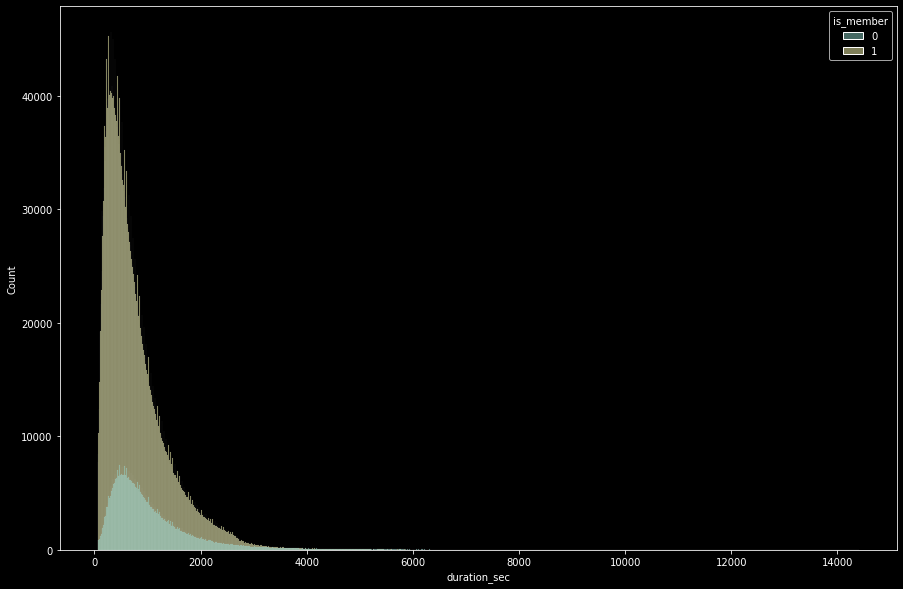

In [5]:
plt.figure(figsize=(15,10))
sns.histplot(data=df_data,x='duration_sec', hue='is_member')

In [6]:
cities = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [7]:
gdf = gpd.GeoDataFrame(df_stations, geometry=gpd.points_from_xy(df_stations.longitude, df_stations.latitude))

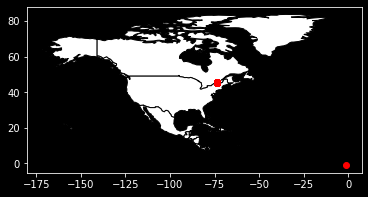

In [8]:
ax = world[world.continent == 'North America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red')

plt.show()

In [9]:
df_stations[df_stations['longitude']>=-5]

,pk,name,latitude,longitude,geometry
570,856,Smith / Peel,-1.0,-1.0,POINT (-1.00000 -1.00000)


In [10]:
lat, long = 45.49277056666423, -73.5564096881966
df_stations['latitude'] = df_stations['latitude'].replace(to_replace=-1.0, value=lat)
df_stations['longitude'] = df_stations['longitude'].replace(to_replace=-1.0, value=long)
print(df_stations[df_stations['longitude']>=-5])

Empty DataFrame
Columns: [pk, name, latitude, longitude, geometry]
Index: []


In [11]:
df_start = df_data['emplacement_pk_start'].value_counts()
df_end = df_data['emplacement_pk_end'].value_counts()
df_start.head()
df_end.head()

256    47203
173    35689
470    34669
242    31843
332    31497
Name: emplacement_pk_end, dtype: int64

In [12]:
df_joined = df_stations.join(df_start, on='pk', lsuffix='_caller', rsuffix='_other')
df_joined = df_joined.join(df_end, on='pk', lsuffix='_caller', rsuffix='_other')

df_joined.head()

,pk,name,latitude,longitude,geometry,emplacement_pk_start,emplacement_pk_end
0,10,Métro Angrignon (Lamont / des Trinitaires),45.446910,-73.603630,POINT (-73.60363 45.44691),4398.0,4763
1,13,Métro de l'Église (Ross / de l'Église),45.462726,-73.565959,POINT (-73.56596 45.46273),7988.0,8850
2,17,Tolhurst / Fleury,45.544149,-73.667520,POINT (-73.66752 45.54415),2592.0,2833
3,21,St-Christophe / Cherrier,45.520290,-73.568119,POINT (-73.56812 45.52029),5619.0,3585
4,31,Lespérance / de Rouen,45.538839,-73.552779,POINT (-73.55278 45.53884),3383.0,4059


In [13]:
gdf = gpd.GeoDataFrame(df_joined, geometry=gpd.points_from_xy(df_stations.longitude, df_stations.latitude), crs='EPSG:4326')
#gdf = gpd.GeoDataFrame(Point(df_stations['latitude'].to_numpy(), df_stations['longitude'].to_numpy()), geometry=0, crs="EPSG:3857")

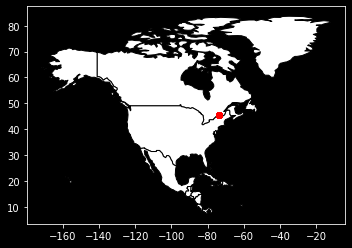

In [14]:
ax = world[world.continent == 'North America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red')

plt.show()

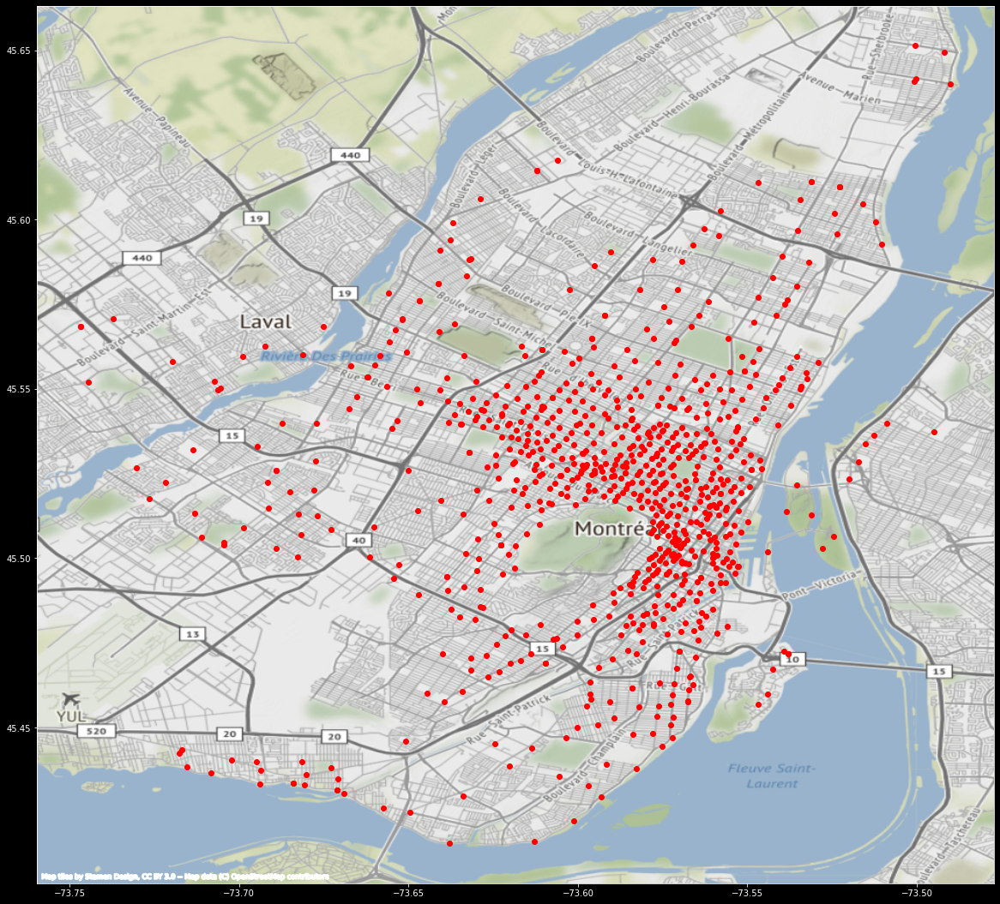

In [15]:
fig, ax = plt.subplots(figsize=(20,20))
montreal = cx.Place("Montreal")
gdf.plot(ax=ax, color='red')
cx.add_basemap(ax, crs=gdf.crs)

In [16]:
gdf.sort_values(by='emplacement_pk_start', ascending=False).head()

,pk,name,latitude,longitude,geometry,emplacement_pk_start,emplacement_pk_end
136,256,Métro Mont-Royal (Rivard / du Mont-Royal),45.524673,-73.582550,POINT (-73.58255 45.52467),47793.0,47203
122,242,du Mont-Royal / Clark,45.519410,-73.586850,POINT (-73.58685 45.51941),35899.0,31843
60,173,Marquette / du Mont-Royal,45.532290,-73.575440,POINT (-73.57544 45.53229),35731.0,35689
201,330,Parc Jeanne Mance (monument sir George-Etienne...,45.514840,-73.584779,POINT (-73.58478 45.51484),31685.0,22660
54,167,Boyer / du Mont-Royal,45.527432,-73.579917,POINT (-73.57992 45.52743),31229.0,30813


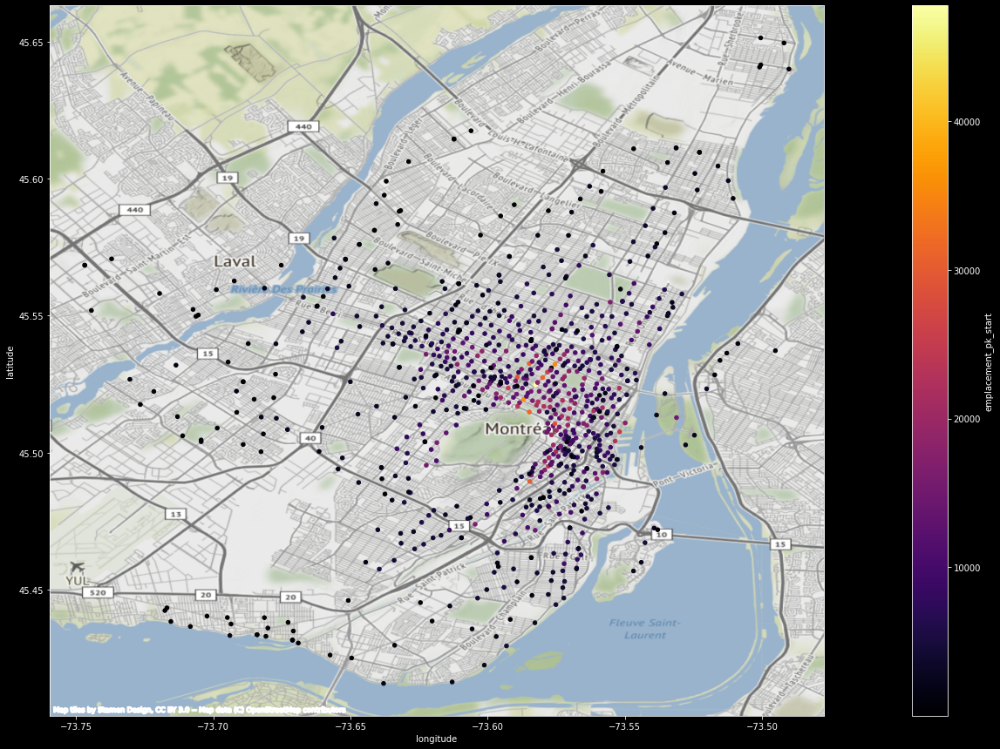

In [17]:
fig, ax = plt.subplots(figsize=(36,15))
montreal = cx.Place("Montreal")
gdf.plot(kind='scatter', x='longitude', y='latitude', c='emplacement_pk_start', ax=ax, cmap='inferno')
cx.add_basemap(ax, crs=gdf.crs)

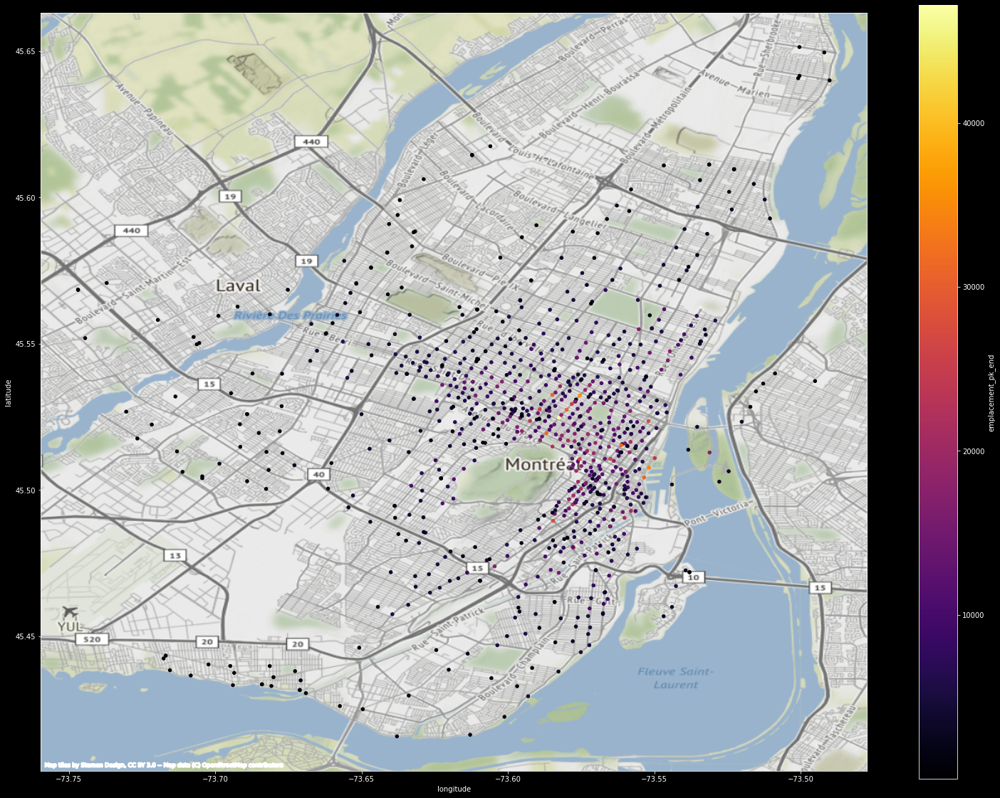

In [18]:
fig, ax = plt.subplots(figsize=(26,20))
montreal = cx.Place("Montreal")
gdf.plot(kind='scatter', x='longitude', y='latitude', c='emplacement_pk_end', ax=ax, cmap='inferno')
cx.add_basemap(ax, crs=gdf.crs)

In [19]:
df_data['start_end_pk'] = df_data['emplacement_pk_start'].astype(str) + '-' + df_data['emplacement_pk_end'].astype(str)
df_data.head()

,start_date,emplacement_pk_start,end_date,emplacement_pk_end,duration_sec,is_member,start_end_pk
0,2021-05-21 17:21:44.934,10,2021-05-21 18:07:58.699,10,2773,1,10-10
1,2021-06-12 14:45:02.959,10,2021-06-12 15:11:14.937,187,1571,0,10-187
2,2021-08-27 08:19:17.396,10,2021-08-27 08:29:04.477,506,587,1,10-506
3,2021-06-11 19:07:28.724,10,2021-06-11 19:50:30.214,10,2581,0,10-10
4,2021-05-25 07:19:29.669,10,2021-05-25 07:47:42.001,423,1692,1,10-423


In [20]:
df_travels = df_data['start_end_pk'].value_counts()
df_data = df_data.join(df_travels, on='start_end_pk', lsuffix='_caller', rsuffix='_other')
df_data.head()

,start_date,emplacement_pk_start,end_date,emplacement_pk_end,duration_sec,is_member,start_end_pk_caller,start_end_pk_other
0,2021-05-21 17:21:44.934,10,2021-05-21 18:07:58.699,10,2773,1,10-10,684
1,2021-06-12 14:45:02.959,10,2021-06-12 15:11:14.937,187,1571,0,10-187,37
2,2021-08-27 08:19:17.396,10,2021-08-27 08:29:04.477,506,587,1,10-506,438
3,2021-06-11 19:07:28.724,10,2021-06-11 19:50:30.214,10,2581,0,10-10,684
4,2021-05-25 07:19:29.669,10,2021-05-25 07:47:42.001,423,1692,1,10-423,50


In [21]:
df_start_end = df_data.groupby(['emplacement_pk_start','emplacement_pk_end']).size().reset_index().rename(columns={0:'count'}).sort_values(by='count')
df_start_end

,emplacement_pk_start,emplacement_pk_end,count
86033,314,190,1
244352,782,222,1
244362,782,233,1
244372,782,245,1
89221,321,368,1
...,...,...,...
276506,949,949,1851
151485,469,469,1852
152111,470,470,2362
116337,381,381,2432


In [22]:
def whereto(pk_start):
    if pk_start in df_stations['pk'].unique():
        df_tojoin = df_start_end[df_start_end['emplacement_pk_start']==pk_start].rename(columns={'emplacement_pk_end': 'pk'})
        df_where_to = df_tojoin.merge(df_joined, on=['pk', 'pk'], how='left').sort_values(by='count',ascending=False)
        fig, ax = plt.subplots(figsize=(26,20))
        montreal = cx.Place("Montreal")
        df_where_to.plot(kind='scatter', x='longitude', y='latitude', c='count', ax=ax, cmap='Reds')
        df_where_to[df_where_to['pk']==pk_start].plot(x='longitude', y='latitude', ax=ax, c='red', marker='+', markersize=20, zorder=-1)
        cx.add_basemap(ax, crs=gdf.crs, zorder=-1000)
    else:
        print('Wrong parking index')
    return

def fromwhere(pk_end):
    if pk_end in df_stations['pk'].unique():
        df_tojoin = df_start_end[df_start_end['emplacement_pk_end']==pk_end].rename(columns={'emplacement_pk_start': 'pk'})
        df_fromwhere = df_tojoin.merge(df_joined, on=['pk', 'pk'], how='left').sort_values(by='count',ascending=False)
        fig, ax = plt.subplots(figsize=(26,20))
        montreal = cx.Place("Montreal")
        df_fromwhere.plot(kind='scatter', x='longitude', y='latitude', c='count', ax=ax, cmap='Reds')
        df_fromwhere[df_fromwhere['pk']==pk_end].plot(x='longitude', y='latitude', ax=ax, c='red', marker='+', markersize=20, zorder=-1)
        cx.add_basemap(ax, crs=gdf.crs, zorder=-1000)
    else:
        print('Wrong parking index')
    return


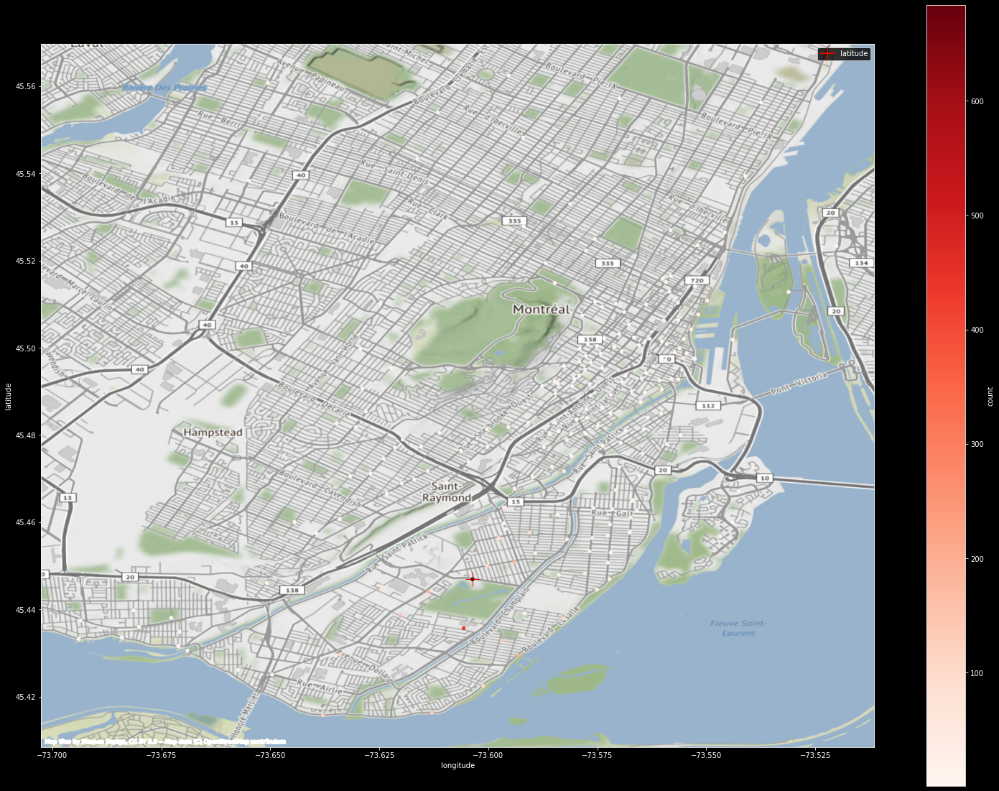

In [23]:
whereto(10)

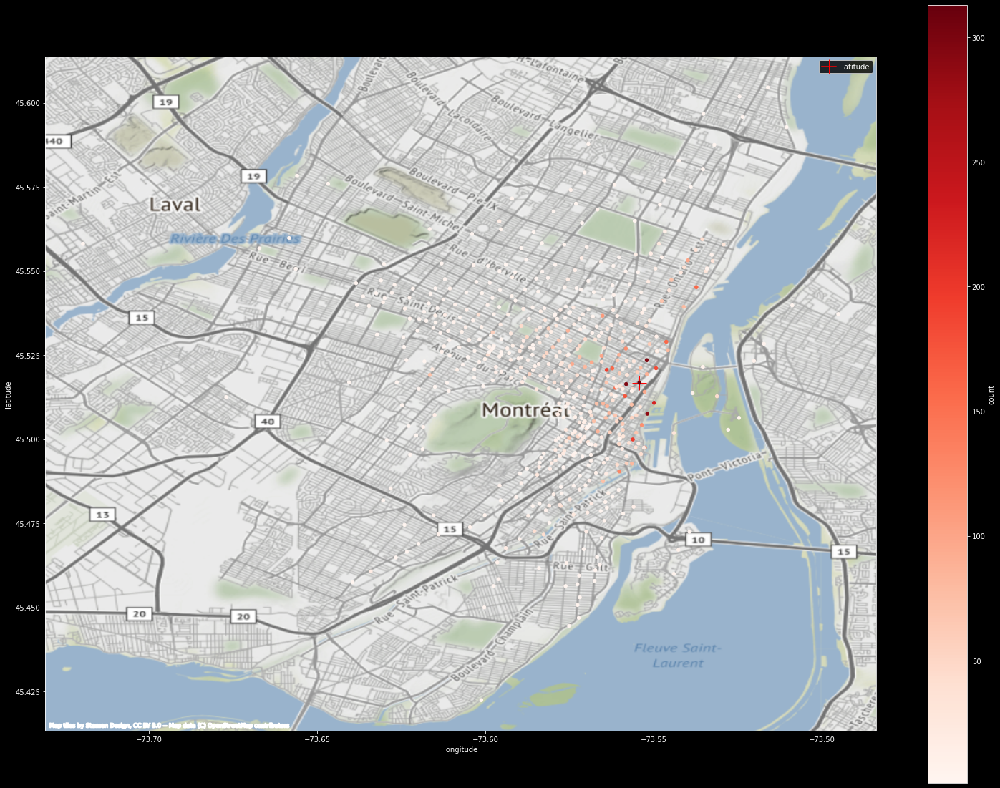

In [25]:
fromwhere(276)